In [1]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
from matplotlib.pyplot import imread



In [2]:
import os
import numpy as np
from tqdm import tqdm
from PIL import Image

Datapath = '/kaggle/input/faces-dataset-small/faces_dataset_small'
GENERATE_RES = 2
GENERATE_SQUARE = 64 * GENERATE_RES  # This should be 128, because 64 * 2 = 128
channels = 3
Prev_rows = 4
Prev_cols = 7
PREV_Margin = 16
SEED_VALUE = 128

Buffer_size = 6000
batch_size = 16



In [3]:
train_data = []
for f in tqdm(os.listdir(Datapath)):
    path = os.path.join(Datapath, f)
    img = Image.open(path).convert('RGB').resize((GENERATE_SQUARE, GENERATE_SQUARE), Image.LANCZOS)
    try:
        img_np = np.asarray(img)
        if img_np.shape != (GENERATE_SQUARE, GENERATE_SQUARE, 3): 
            raise ValueError(f"Image {f} has incorrect shape {img_np.shape}.")
        train_data.append(img_np)
    except Exception as e:
        print(f"Skipping file {f} due to error: {e}")

# Convert to NumPy array and preprocess
train_data = np.reshape(train_data, (-1, GENERATE_SQUARE, GENERATE_SQUARE, 3))  
train_data = train_data.astype("float32")
train_data = train_data / 127.5 - 1  


100%|██████████| 3143/3143 [04:54<00:00, 10.68it/s]


In [4]:
train_data.shape

(3143, 128, 128, 3)

In [7]:
import tensorflow as tf


train_data = np.array(train_data) 

train_dataset = tf.data.Dataset.from_tensor_slices(train_data)
train_dataset = train_dataset.shuffle(Buffer_size).batch(batch_size)

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, Model

SEED_VALUE = 512
class AdaIN(layers.Layer):
    
    def call(self, inputs):
        content, style = inputs
        mean, variance = tf.nn.moments(content, axes=[1, 2], keepdims=True)
        epsilon = 1e-5
        normalized = (content - mean) / tf.sqrt(variance + epsilon)
        style_mean, style_std = tf.split(style, 2, axis=-1)
        return style_std * normalized + style_mean


class NoiseInjection(layers.Layer):
    def call(self, inputs):
       
        noise = tf.random.normal(shape=tf.shape(inputs))  
        return inputs + noise

def build_stylegan_generator(SEED_VALUE, channels):
    
    # Mapping network (latent space to intermediate style vector)
    mapping_input = layers.Input(shape=(SEED_VALUE,))
    x = layers.Dense(512, activation='relu')(mapping_input)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dense(512, activation='relu')(x)
    mapping_network = Model(inputs=mapping_input, outputs=x)

    # Start generator model
    z = layers.Input(shape=(SEED_VALUE,))
    style_vector = mapping_network(z)

    # Initial feature map
    x = layers.Dense(4 * 4 * 512)(z)
    x = layers.Reshape((4, 4, 512))(x)
    x = layers.Conv2DTranspose(512, 3, strides=2, padding='same')(x)  
    x = NoiseInjection()(x)  
    x = layers.LeakyReLU(alpha=0.2)(x)

    # Upsampling stages with noise injection
    filters = [256, 128, 64, channels]
    for filter_count in filters[:-1]:  
        x = layers.Conv2DTranspose(filter_count, 3, strides=2, padding='same')(x)
        x = NoiseInjection()(x) 
        x = layers.LeakyReLU(alpha=0.2)(x)

    # Final output layer
    x = layers.Conv2DTranspose(channels, 3, strides=2, padding='same')(x) 
    x = layers.Activation('tanh')(x)  

    # Create the final generator model
    generator_model = Model(inputs=z, outputs=x)
    return generator_model

# Example usage
generator = build_stylegan_generator(SEED_VALUE, channels)
generator.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 8192)                │       4,202,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ noise_injection (NoiseInjection)     │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 256)         │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ noise_injection_1 (NoiseInjection)   │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ noise_injection_2 (NoiseInjection)   │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ noise_injection_3 (NoiseInjection)   │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 128, 128, 3)         │           1,731 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 128, 128, 3)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 8,112,771 (30.95 MB)

 Trainable params: 8,112,771 (30.95 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential

def build_discriminator(image_shape):
    model = Sequential()

    # First convolutional block
    model.add(layers.Conv2D(32, kernel_size=3, strides=2, padding="same", input_shape=image_shape))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.25))

    # Second convolutional block
    model.add(layers.Conv2D(32, kernel_size=3, strides=2, padding="same"))
    model.add(layers.ZeroPadding2D(padding=((0, 1), (0, 1))))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.25))

    # Third convolutional block
    model.add(layers.Conv2D(64, kernel_size=3, strides=2, padding="same"))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.25))

    # Fourth convolutional block
    model.add(layers.Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(layers.BatchNormalization(momentum=0.8))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.25))



    model.add(layers.Flatten())

    # Dynamically calculate the number of units after Flatten
    dummy_input = tf.keras.Input(shape=image_shape)
    dummy_model = tf.keras.Model(inputs=dummy_input, outputs=model(dummy_input))
    flatten_units = dummy_model.output_shape[1]

    # Add dense layers
    model.add(layers.Dense(flatten_units, activation="relu"))
    model.add(layers.Dense(1, activation="sigmoid"))

    return model


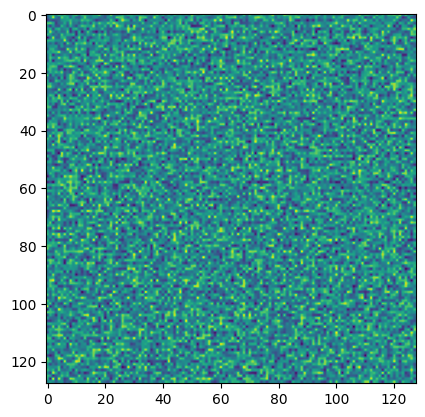

In [10]:
gen = build_stylegan_generator(SEED_VALUE, channels) # Removed GENERATE_RES, using SEED_VALUE for seed_size and channels as is
noise = tf.random.normal((1, SEED_VALUE))
generated_image = gen(noise)
plt.imshow(generated_image[0, :, :, 0])

In [11]:
generated_image.shape




TensorShape([1, 128, 128, 3])

In [12]:
image_shape = (GENERATE_SQUARE, GENERATE_SQUARE, channels)
dis = build_discriminator(image_shape)

decision = dis(generated_image)



/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
# Print decision (assuming decision is a variable or result from previous operations)
print(decision)

# Cross entropy loss definition
cross_entropy = tf.keras.losses.BinaryCrossentropy()

# Discriminator loss function
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# Generator loss function
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Optimizers
gen_optim = tf.keras.optimizers.Adam(learning_rate=1e-4)
dis_optim = tf.keras.optimizers.Adam(learning_rate=1e-4)



tf.Tensor([[0.5037234]], shape=(1, 1), dtype=float32)


In [15]:
import time
from IPython import display
import tensorflow as tf

def train_gan(generator, discriminator, dataset, epochs, seed):
    
    # Define checkpoint management
    checkpoint_dir = './training_checkpoints'  
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    checkpoint = tf.train.Checkpoint(generator_optimizer=gen_optim,
                                     discriminator_optimizer=dis_optim,
                                     generator=generator,
                                     discriminator=discriminator)

    for epoch in range(epochs):
        start_time = time.time()

        for image_batch in dataset:
           
            train_step(generator, discriminator, image_batch, gen_optim, dis_optim)

        # Dynamically display generated images
        generate_and_display_images(generator, epoch + 1, seed)

        # Save checkpoint every 5 epochs
        if (epoch + 1) % 5 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        # Print epoch details
        print(f"Epoch {epoch + 1}/{epochs} completed in {time.time() - start_time:.2f}s")


In [ ]:
import numpy as np
from skimage.metrics import structural_similarity as ssim

def compute_ssim(real_images, fake_images, win_size=3):
    ssim_values = []
    for i in range(len(real_images)):
        # Convert TensorFlow tensors to NumPy arrays
        real_image_np = real_images[i].numpy()
        fake_image_np = fake_images[i].numpy()

        # Calculate SSIM with data_range set to 1 for normalized images in range [0, 1]
        score, _ = ssim(real_image_np, fake_image_np, full=True, multichannel=True, win_size=win_size, data_range=1)
        ssim_values.append(score)
    return np.array(ssim_values)



# Function to classify images into easy, medium, hard based on SSIM scores
def classify_images_by_difficulty(real_images, fake_images, easy_threshold=0.7, hard_threshold=0.9):
    # Compute SSIM score between real and fake images
    ssim_scores = compute_ssim(real_images, fake_images)

    easy_images = []
    medium_images = []
    hard_images = []

    # Classify based on SSIM score
    for i, score in enumerate(ssim_scores):
        if score < easy_threshold:
            easy_images.append(fake_images[i])
        elif score > hard_threshold:
            hard_images.append(fake_images[i])
        else:
            medium_images.append(fake_images[i])

    return np.array(easy_images), np.array(medium_images), np.array(hard_images)

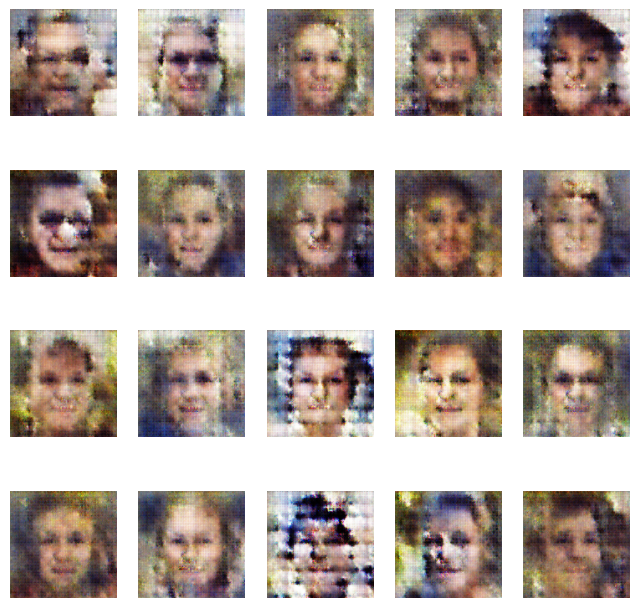

Epoch 50/50 - Gen Loss: 1.5271, Dis Loss: 1.0097, Time: 76.45s


<Figure size 1000x500 with 0 Axes>

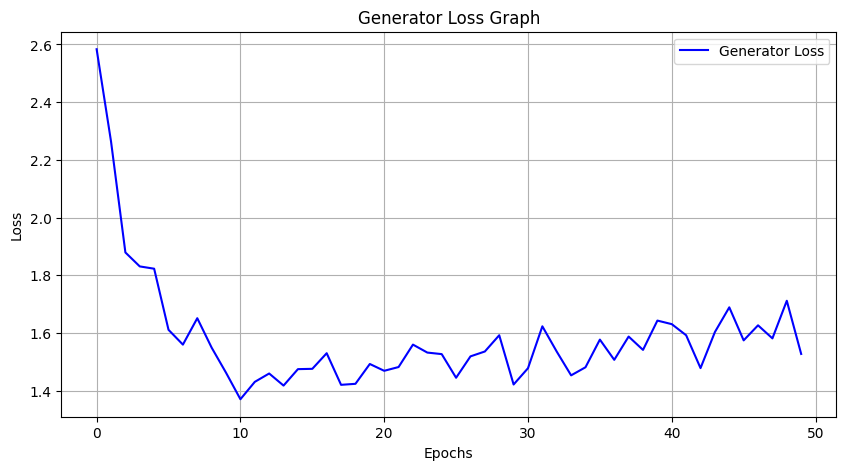

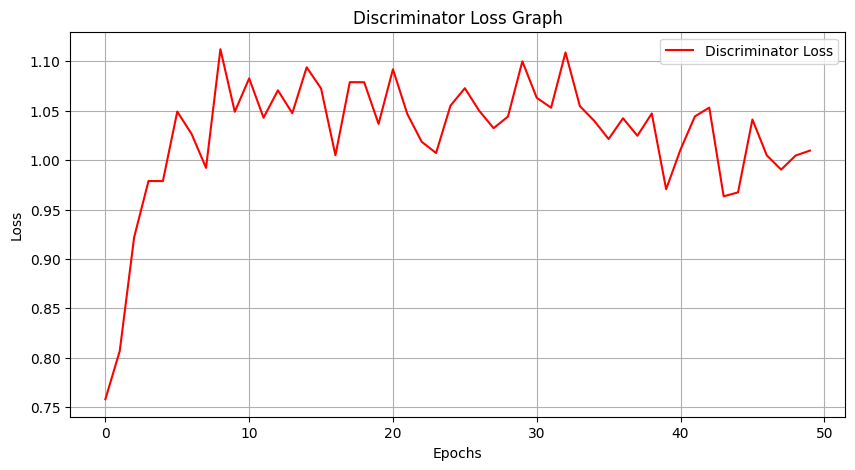

Training complete.


In [18]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time

SEED_VALUE=512

# Directory for saving images
os.makedirs('generated_images', exist_ok=True)
os.makedirs('loss_graphs', exist_ok=True)

# Function for adaptive mixing of real and fake images
def adaptive_mix(real_images, fake_images, alpha=0.2, noise_std=0.05):
    min_batch_size = min(tf.shape(real_images)[0], tf.shape(fake_images)[0])
    real_images = real_images[:min_batch_size]
    fake_images = fake_images[:min_batch_size]
    lam = tf.random.uniform((min_batch_size,), minval=0, maxval=1, dtype=tf.float32)
    lam = tf.reshape(lam, [min_batch_size, 1, 1, 1])
    mixed_images = lam * real_images + (1 - lam) * fake_images
    noise = tf.random.normal(shape=tf.shape(mixed_images), mean=0.0, stddev=noise_std)
    mixed_images += noise
    return mixed_images, lam

# Function to generate and save images
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = predictions[:20]
    plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 5, i + 1)
        generated_image = (predictions[i] * 0.5) + 0.5
        plt.imshow(np.clip(generated_image, 0, 1))
        plt.axis('off')
    filename = f"generated_images/epoch_{epoch:04d}.png"
    plt.savefig(filename)
    display.clear_output(wait=True)  
    display.display(plt.gcf()) 
    plt.close()

# Function to plot and update the loss graph continuously
def plot_loss_graph(gen_loss_history, dis_loss_history):
    plt.figure(figsize=(10, 5))

    gen_loss_history = np.array(gen_loss_history)
    dis_loss_history = np.array(dis_loss_history)

    plt.figure(figsize=(10, 5))
    plt.plot(gen_loss_history, label="Generator Loss", color='blue')
    plt.title("Generator Loss Graph")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.savefig("loss_graphs/generator_loss.png") 
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(dis_loss_history, label="Discriminator Loss", color='red')
    plt.title("Discriminator Loss Graph")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.savefig("loss_graphs/discriminator_loss.png")
    plt.show()


# Function for curriculum learning and adaptive mix
def train_with_adaptive_curriculum(generator, discriminator, dataset, epochs, seed, alpha=0.2, noise_std=0.05):
    checkpoint_dir = './training_checkpoints'
    checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
    checkpoint = tf.train.Checkpoint(generator=generator, discriminator=discriminator)

    generator_loss_history = []
    discriminator_loss_history = []

    plt.ion() 
    plt.figure(figsize=(10, 5))

    for epoch in range(epochs):
        start_time = time.time()
        gen_losses, dis_losses = [], []

        for image_batch in dataset:
            # Generate fake images
            noise = tf.random.normal([batch_size, SEED_VALUE])
            fake_images = generator(noise, training=True)

            # Apply adaptive mixing
            mixed_images, lam = adaptive_mix(image_batch, fake_images, alpha, noise_std)

            # Split mixed images into easy, medium, and hard categories
            thresholds = [0.33, 0.66]  # Define thresholds for splitting
            easy_images, medium_images, hard_images = classify_images_by_difficulty(image_batch, fake_images)

            # Select images for current epoch based on stage
            if epoch < epochs * 0.33:
                discriminator_input = easy_images
            elif epoch < epochs * 0.66:
                discriminator_input = medium_images
            else:
                discriminator_input = hard_images

            # Train the discriminator
            with tf.GradientTape() as dis_tape:
                real_output = discriminator(discriminator_input, training=True)
                fake_output = discriminator(fake_images, training=True)
                dis_loss = discriminator_loss(real_output, fake_output)

            dis_gradients = dis_tape.gradient(dis_loss, discriminator.trainable_variables)
            dis_optim.apply_gradients(zip(dis_gradients, discriminator.trainable_variables))

            # Train the generator
            with tf.GradientTape() as gen_tape:
                fake_images = generator(noise, training=True)
                fake_output = discriminator(fake_images, training=True)
                gen_loss = generator_loss(fake_output)

            gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
            gen_optim.apply_gradients(zip(gen_gradients, generator.trainable_variables))

            # Record losses
            gen_losses.append(gen_loss.numpy())
            dis_losses.append(dis_loss.numpy())

        # Append mean epoch losses to history
        generator_loss_history.append(np.mean(gen_losses))
        discriminator_loss_history.append(np.mean(dis_losses))

        # Generate and save images
        test_input = tf.random.normal([batch_size, SEED_VALUE])
        generate_and_save_images(generator, epoch + 1, test_input)

        # Print epoch summary
        print(f"Epoch {epoch + 1}/{epochs} - "
              f"Gen Loss: {np.mean(gen_losses):.4f}, Dis Loss: {np.mean(dis_losses):.4f}, "
              f"Time: {time.time() - start_time:.2f}s")

        # Plot and update the loss graph
        plot_loss_graph(generator_loss_history, discriminator_loss_history)

    # Save the final model checkpoint
    checkpoint.save(file_prefix=checkpoint_prefix)
    plt.ioff() 
    print("Training complete.")


# Hyperparameters
epochs = 50
batch_size = 32
seed = tf.random.normal([batch_size, SEED_VALUE])

# Call the training function
train_with_adaptive_curriculum(generator=gen,
                               discriminator=dis,
                               dataset=train_dataset,
                               epochs=epochs,
                               seed=seed)



In [19]:
!pip install imageio
import os
print(os.listdir('generated_images'))

['epoch_0013.png', 'epoch_0008.png', 'epoch_0004.png', 'epoch_0041.png', 'epoch_0011.png', 'epoch_0010.png', 'epoch_0006.png', 'epoch_0001.png', 'epoch_0027.png', 'epoch_0007.png', 'epoch_0002.png', 'epoch_0030.png', 'epoch_0016.png', 'epoch_0020.png', 'epoch_0043.png', 'epoch_0050.png', 'epoch_0028.png', 'epoch_0038.png', 'epoch_0047.png', 'epoch_0017.png', 'epoch_0024.png', 'epoch_0019.png', 'epoch_0029.png', 'epoch_0021.png', 'epoch_0009.png', 'epoch_0033.png', 'epoch_0022.png', 'epoch_0040.png', 'epoch_0045.png', 'epoch_0049.png', 'epoch_0048.png', 'epoch_0046.png', 'epoch_0003.png', 'epoch_0035.png', 'epoch_0037.png', 'epoch_0036.png', 'epoch_0044.png', 'epoch_0018.png', 'epoch_0023.png', 'epoch_0012.png', 'epoch_0031.png', 'epoch_0032.png', 'epoch_0014.png', 'epoch_0005.png', 'epoch_0025.png', 'epoch_0026.png', 'epoch_0015.png', 'epoch_0039.png', 'epoch_0042.png', 'epoch_0034.png']


Images found: ['generated_images/epoch_0001.png', 'generated_images/epoch_0002.png', 'generated_images/epoch_0003.png', 'generated_images/epoch_0004.png', 'generated_images/epoch_0005.png', 'generated_images/epoch_0006.png', 'generated_images/epoch_0007.png', 'generated_images/epoch_0008.png', 'generated_images/epoch_0009.png', 'generated_images/epoch_0010.png', 'generated_images/epoch_0011.png', 'generated_images/epoch_0012.png', 'generated_images/epoch_0013.png', 'generated_images/epoch_0014.png', 'generated_images/epoch_0015.png', 'generated_images/epoch_0016.png', 'generated_images/epoch_0017.png', 'generated_images/epoch_0018.png', 'generated_images/epoch_0019.png', 'generated_images/epoch_0020.png', 'generated_images/epoch_0021.png', 'generated_images/epoch_0022.png', 'generated_images/epoch_0023.png', 'generated_images/epoch_0024.png', 'generated_images/epoch_0025.png', 'generated_images/epoch_0026.png', 'generated_images/epoch_0027.png', 'generated_images/epoch_0028.png', 'gene

<ipython-input-20-f6b383b34930>:22: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images = [imageio.imread(img) for img in image_files]


GIF saved at generated_images/training_progress.gif


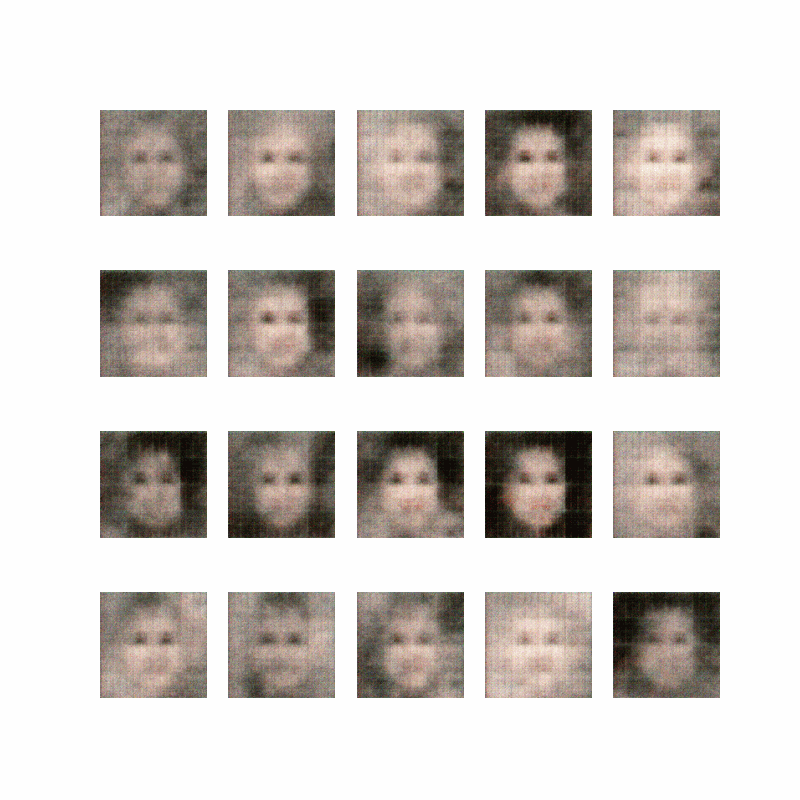

In [20]:
import imageio
from IPython.display import Image, display
import os

def create_and_display_gif(image_folder, gif_name="training_progress.gif"):
    """
    Creates a GIF from the images saved in the specified folder and displays it in the notebook.
    """
    # Get all image files in the directory and sort by epoch
    image_files = sorted(
        [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.png')]
    )

    if not image_files:
        print("No images found in the folder!")
        return

    print(f"Images found: {image_files}")

    try:
        # Read images and create the GIF
        images = [imageio.imread(img) for img in image_files]
        gif_path = os.path.join(image_folder, gif_name)
        imageio.mimsave(gif_path, images, fps=2)  
        print(f"GIF saved at {gif_path}")
    except Exception as e:
        print(f"Error while creating GIF: {e}")

    # Display the GIF in the notebook
    display(Image(filename=gif_path))

create_and_display_gif("generated_images")